In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

In [2]:
# Contoh file path
# accel_file = 'path/to/accel.csv'
# gyro_file = 'path/to/gyro.csv'

def load_sensor(file_path, columns):
    df = pd.read_csv(file_path)
    if 'time' in df.columns:
        df['elapsed'] = df['time'] #menggunakan timestamp absolute
    else:
        print(f"Warning: 'time' column not found in {file_path}.Using 'second_elapsed'.")
        df['elapsed'] = df['second_elapsed']
        
    #Normalisasi elapsed time dari awal sesi (akn mengubah nanoseconds menjadi detik jika 'tim nanoseconds')
    #Andamungakin perlu mengonversi unit jika 'time' adalah nanoseconds
    if df['elapsed'].dtype == 'int64' and df['elapsed'].iloc[0] > 1e12:
        df['elapsed'] = df['elapsed'] / 1e9
        
    
    # df.columns = ['time', 'elapsed'] + columns
    
    df['elapsed'] = df['elapsed'] - df['elapsed'].min()
    return df[['elapsed'] + columns]

# df_accel = load_sensor(accel_file, ['z_accel', 'y_accel', 'x_accel'])
# df_gyro = load_sensor(gyro_file, ['z_gyro', 'y_gyro', 'x_gyro'])
# df_accel.head()

In [3]:
def load_all_data(base_dir):
    all_data = []

    for subjek in sorted(os.listdir(base_dir)):
        subjek_path = os.path.join(base_dir, subjek)

        if os.path.isdir(subjek_path):
            for run in sorted(os.listdir(subjek_path)):
                run_path = os.path.join(subjek_path, run)
                
                accel_path = os.path.join(run_path, 'Accelerometer.csv')
                gyro_path = os.path.join(run_path, 'Gyroscope.csv')

                if os.path.exists(accel_path) and os.path.exists(gyro_path):
                    df_accel = load_sensor(accel_path, ['z', 'y', 'x'])
                    df_gyro = load_sensor(gyro_path, ['z', 'y', 'x'])

                    # Merge kedua sensor berdasarkan waktu (elapsed)
                    df_merged = pd.merge_asof(
                        df_accel.sort_values('elapsed'),
                        df_gyro.sort_values('elapsed'),
                        on='elapsed',
                        direction='nearest'
                    )
                    df_merged['subjek'] = subjek
                    df_merged['run'] = run
                    all_data.append(df_merged)
        else:
            print(f"Skipping: Missing accel.csv or gyro.csv in {run_path}")
    if not all_data:
        print("No data loaded. Check base_dir and file path")
        return pd.DataFrame
    
    return pd.concat(all_data, ignore_index=True)

# Contoh penggunaan
base_directory = "/kaggle/input/human-act-reg-revised/dataset"
final_dataframe = load_all_data(base_directory)

print(final_dataframe.head())
print(final_dataframe.info())

    elapsed     z_x      y_x       x_x     z_y       y_y       x_y   subjek  \
0  0.000000 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1   
1  0.997256 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1   
2  2.072648 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1   
3  3.089331 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1   
4  4.438431 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1   

    run  
0  run1  
1  run1  
2  run1  
3  run1  
4  run1  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44313 entries, 0 to 44312
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   elapsed  44313 non-null  float64
 1   z_x      44313 non-null  float64
 2   y_x      44313 non-null  float64
 3   x_x      44313 non-null  float64
 4   z_y      44313 non-null  float64
 5   y_y      44313 non-null  float64
 6   x_y      44313 non-null  float64
 7   subjek   4

In [4]:

# Asumsi final_dataframe sudah ada dari langkah sebelumnya

# --- Langkah 1: Set 'elapsed' sebagai Index ---
# Pastikan 'elapsed' dalam unit waktu yang benar (misalnya detik)
# Jika 'elapsed' adalah detik, Anda bisa langsung membuat TimedeltaIndex
# Kita akan membuat TimedeltaIndex dari 'elapsed' karena 'elapsed' adalah waktu relatif dari 0.
final_dataframe['time_delta'] = pd.to_timedelta(final_dataframe['elapsed'], unit='s')
resampled_df = final_dataframe.set_index('time_delta')

# Hapus kolom 'elapsed' asli jika tidak lagi dibutuhkan sebagai kolom biasa
# resampled_df = resampled_df.drop(columns=['elapsed'])

# --- Langkah 2 & 3: Tentukan Frekuensi Target dan Lakukan Resampling ---
# Contoh: Resampling ke 100 Hz (setiap 10 milidetik atau '10ms')
# Jika Anda ingin 50 Hz, gunakan '20ms' (1/50 = 0.02 detik = 20 milidetik)
# Jika Anda ingin 1 Hz, gunakan '1s'
target_frequency = '10ms' # Mengatur frekuensi target ke 100 Hz (10 milidetik)

# Lakukan resampling. Pilih metode agregasi yang sesuai.
# 'mean()' umum digunakan untuk data sensor.
# 'first()' atau 'last()' bisa digunakan jika Anda hanya ingin satu titik per interval.
# 'ohlc()' (open, high, low, close) jika data Anda seperti data pasar saham.
# Pisahkan kolom numerik dan non-numerik
numeric_cols = resampled_df.select_dtypes(include='number').columns
# Lakukan resampling hanya pada kolom numerik
resampled_df[numeric_cols] = resampled_df[numeric_cols].resample(target_frequency).mean()

# --- Langkah 4: Tangani Nilai yang Hilang (NaN) ---
# Resampling bisa menghasilkan nilai NaN jika tidak ada data di interval baru
# Metode umum:
# 1. ffill(): mengisi nilai NaN dengan nilai terakhir yang valid
# 2. bfill(): mengisi nilai NaN dengan nilai valid berikutnya
# 3. interpolate(): menginterpolasi nilai NaN berdasarkan nilai di sekitarnya (lebih kompleks tapi sering lebih baik)

# Contoh 1: Mengisi maju (forward fill) lalu mengisi mundur (backward fill)
# ini memastikan semua NaN terisi jika ada NaN di awal data
#resampled_df = resampled_df.ffill().bfill()

# Contoh 2: Interpolasi linear (sering disukai untuk data sensor kontinu)
resampled_df = resampled_df.interpolate(method='linear')

# Setelah resampling, kolom 'subjek' dan 'run' mungkin akan menjadi NaN
# karena mereka bukan nilai numerik yang bisa dirata-ratakan.
# Kita perlu mengisinya kembali. Kita bisa mengambil nilai dari entri pertama dari grup aslinya.
# Atau, jika Anda hanya perlu nilai subjek/run di awal setiap sesi, Anda bisa menambahkannya kembali.

# Cara yang lebih baik untuk menjaga kolom 'subjek' dan 'run' saat resampling
# adalah dengan tidak meresample-nya, lalu menggabungkan kembali.
# Atau, jika nilai 'subjek' dan 'run' konstan untuk seluruh sesi/run,
# Anda bisa mengambil nilai pertama dari masing-masing kolom setelah resampling.

# Mari kita lakukan resampling per 'subjek' dan 'run' agar kolom string tetap utuh
# Ini adalah pendekatan yang lebih kuat dan disarankan untuk data multi-grup:

resampled_all_data = []

# Iterasi melalui setiap subjek dan run yang unik
for (subjek_val, run_val), group_df in final_dataframe.groupby(['subjek','run']):
    print(f"Resampling data for Subject: {subjek_val}, Run: {run_val}")

    # Set 'time_delta' as index for the current group
    group_df['time_delta'] = pd.to_timedelta(group_df['elapsed'],unit='s')
    indexed_group_df = group_df.set_index('time_delta')

    # Drop original elapsed if needed as it's now the index
    indexed_group_df = indexed_group_df.drop(columns=['elapsed','subjek','run']) # Drop subjek/run untuk resampling

    # Resample the group
    resampled_group = indexed_group_df.resample(target_frequency).mean()

    # Fill NaNs after resampling
    resampled_group = resampled_group.ffill().bfill() # Atau .interpolate(method='linear')

    # Add back 'subjek' and 'run' columns
    resampled_group['subjek'] = subjek_val
    resampled_group['run'] = run_val
    resampled_group['elapsed'] = resampled_group.index.total_seconds() # Konversi kembali indeks ke detik

    resampled_all_data.append(resampled_group)

# Gabungkan semua DataFrame yang di-resample
final_resampled_dataframe = pd.concat(resampled_all_data).reset_index(drop=True)

print("\n--- Resampled DataFrame Head ---")
print(final_resampled_dataframe.head())

print("\n--- Resampled DataFrame Info ---")
print(final_resampled_dataframe.info())

print("\n--- Unique Subjects and Runs in Resampled Data ---")
print("Unique subjects:", final_resampled_dataframe['subjek'].unique())
print("Unique runs:", final_resampled_dataframe['run'].unique())

print("\n--- Data counts per Subject-Run combination in Resampled Data ---")
print(final_resampled_dataframe.groupby(['subjek','run']).size())

Resampling data for Subject: subjek1, Run: run1
Resampling data for Subject: subjek1, Run: run2
Resampling data for Subject: subjek2, Run: run1
Resampling data for Subject: subjek2, Run: run2
Resampling data for Subject: subjek3, Run: run1
Resampling data for Subject: subjek3, Run: run2
Resampling data for Subject: subjek4, Run: run1
Resampling data for Subject: subjek4, Run: run2
Resampling data for Subject: subjek5, Run: run1
Resampling data for Subject: subjek5, Run: run2

--- Resampled DataFrame Head ---
      z_x      y_x       x_x     z_y       y_y       x_y   subjek   run  \
0 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1  run1   
1 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1  run1   
2 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1  run1   
3 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1  run1   
4 -0.1824  0.00331 -0.343382 -0.0198 -0.008525  0.044413  subjek1  run1   

   elapsed  
0     0.00  
1     0.0

/tmp/ipykernel_35/4190171330.py:40: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  resampled_df = resampled_df.interpolate(method='linear')


<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

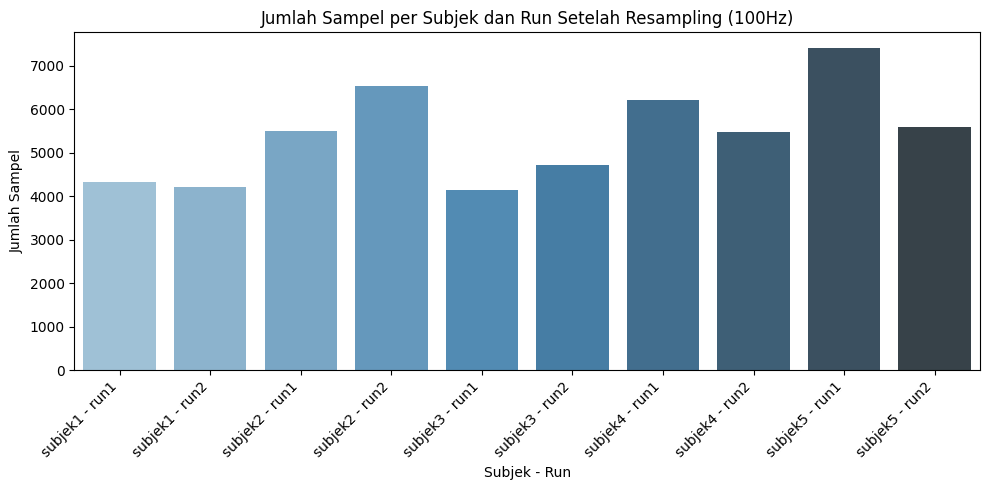

In [5]:
# import matplotlib.pyplot as plt
import seaborn as sns
# import pandas as pd

# Hitung jumlah data per kombinasi subjek dan run
count_per_group = final_resampled_dataframe.groupby(['subjek', 'run']).size().reset_index(name='jumlah_data')
count_per_group['label'] = count_per_group['subjek'] + ' - ' + count_per_group['run']

# Plot barplot
plt.figure(figsize=(10, 5))
sns.barplot(data=count_per_group, x='label', y='jumlah_data', palette='Blues_d')
plt.title('Jumlah Sampel per Subjek dan Run Setelah Resampling (100Hz)')
plt.xlabel('Subjek - Run')
plt.ylabel('Jumlah Sampel')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt

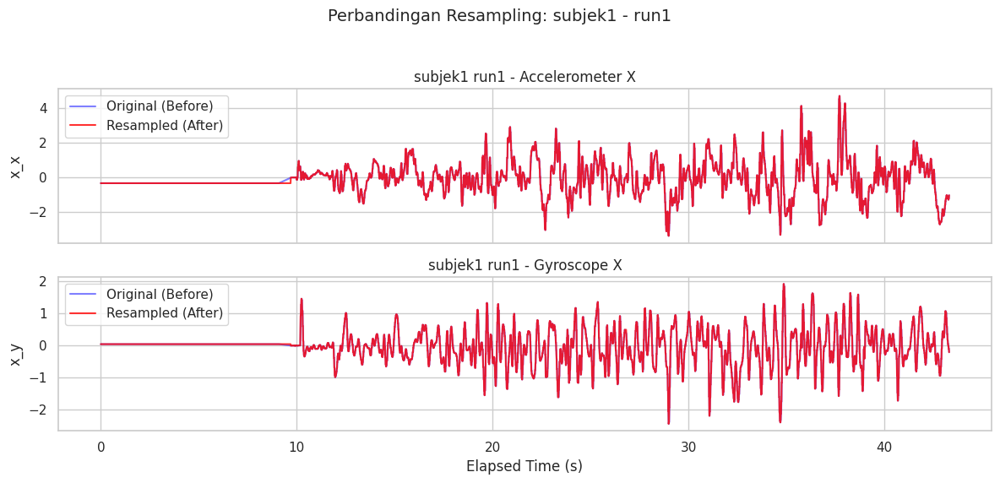

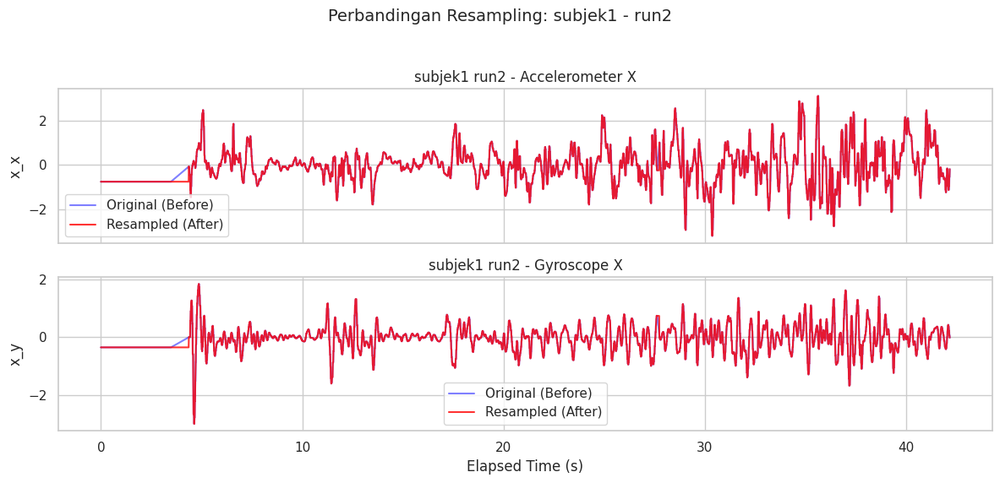

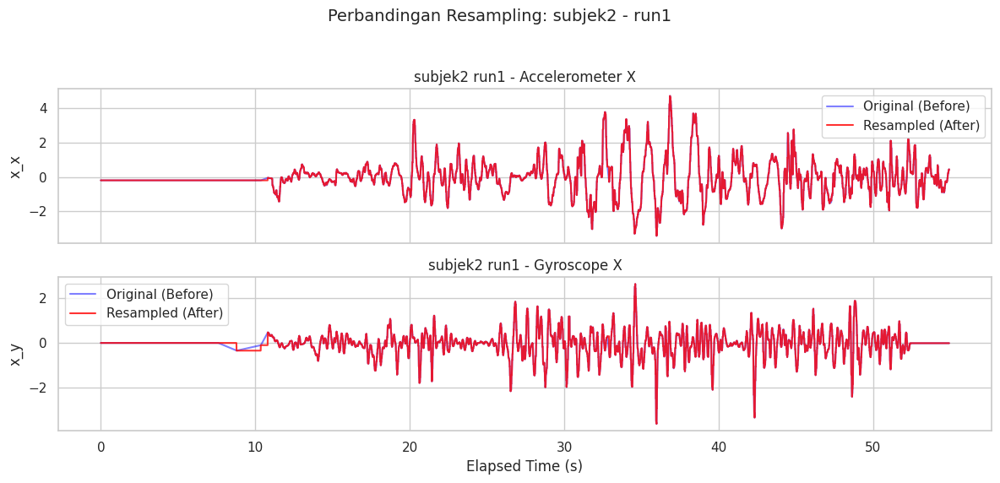

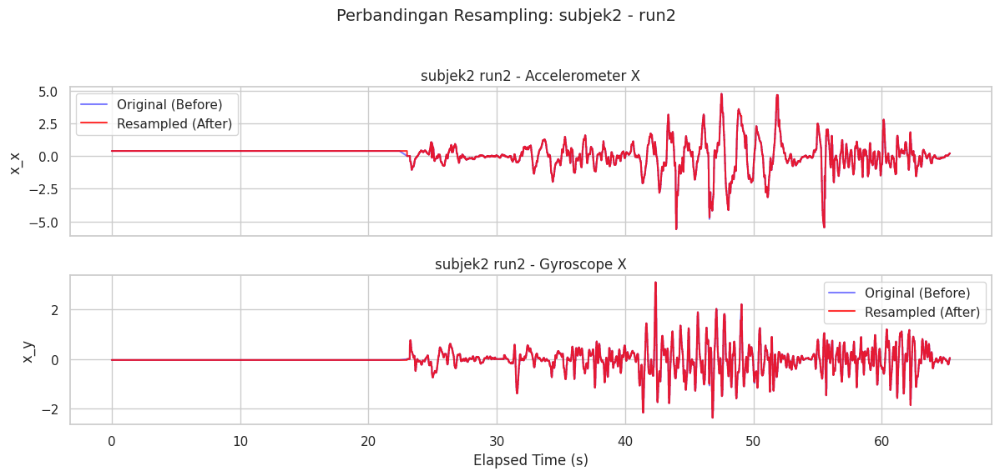

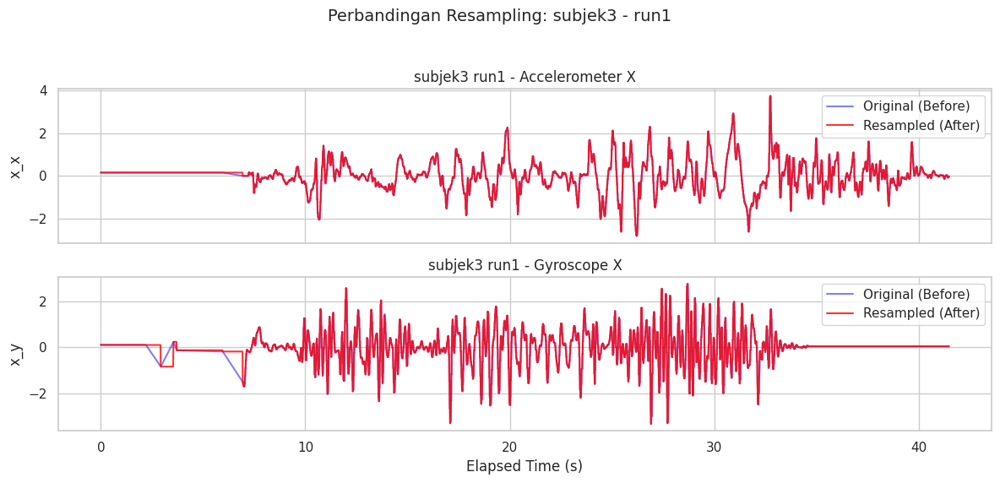

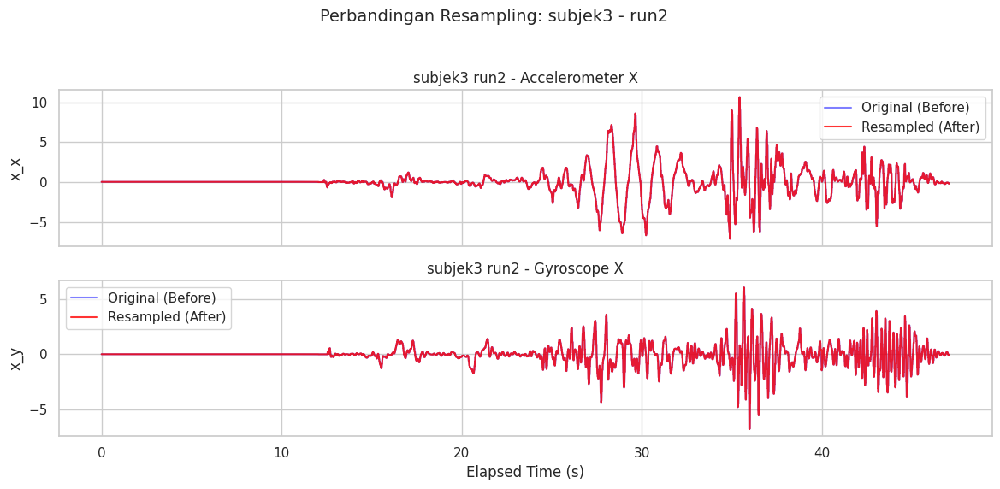

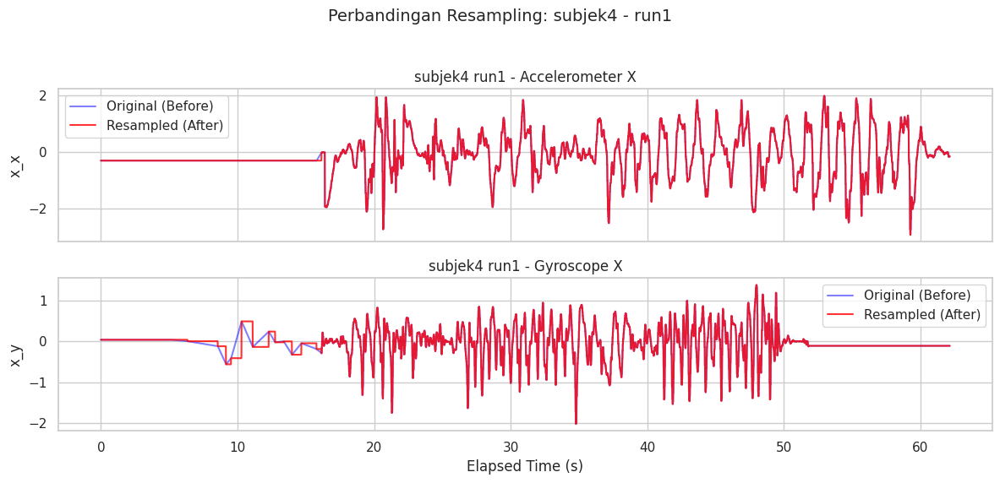

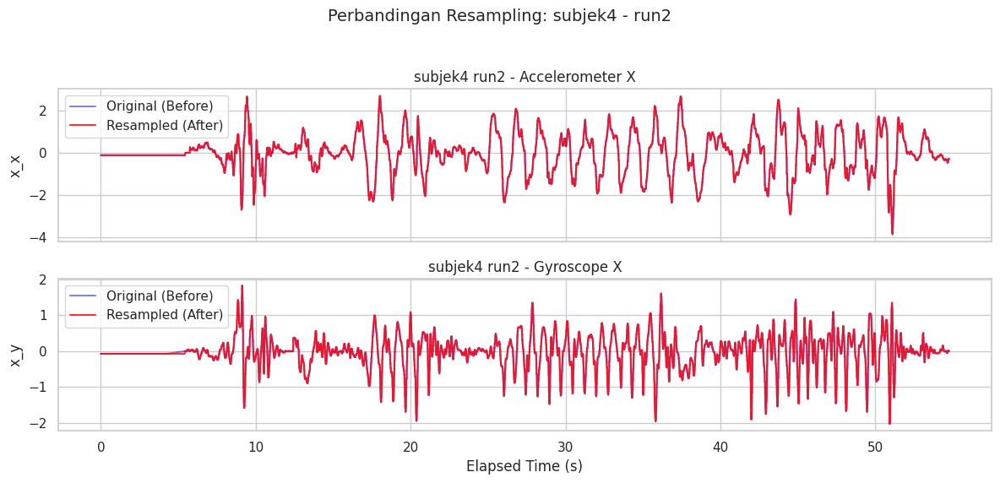

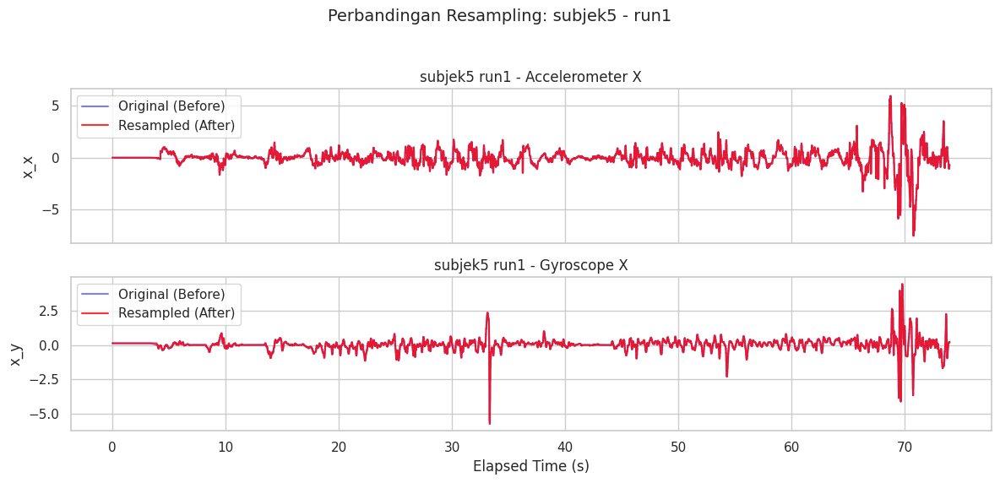

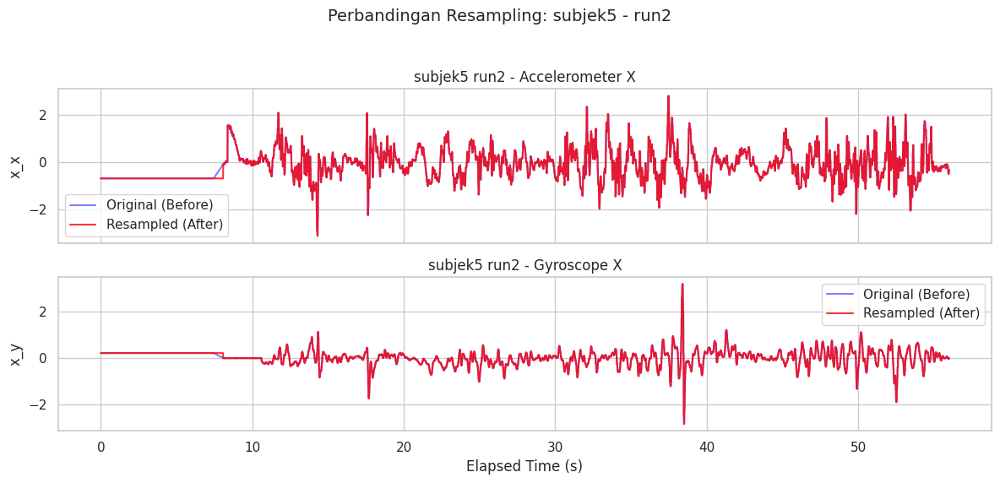

In [6]:
# Atur tema visual
sns.set(style="whitegrid")

# Loop untuk semua kombinasi subjek dan run
unique_combinations = final_dataframe[['subjek', 'run']].drop_duplicates()

for _, row in unique_combinations.iterrows():
    sample_subjek = row['subjek']
    sample_run = row['run']

    # Data sebelum resampling
    original_df = final_dataframe[(final_dataframe['subjek'] == sample_subjek) & (final_dataframe['run'] == sample_run)]

    # Data sesudah resampling
    resampled_df = final_resampled_dataframe[(final_resampled_dataframe['subjek'] == sample_subjek) & (final_resampled_dataframe['run'] == sample_run)]

    # Buat plot
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

    # Plot akselerometer x
    axs[0].plot(original_df['elapsed'], original_df['x_x'], label='Original (Before)', alpha=0.5, color='blue')
    axs[0].plot(resampled_df['elapsed'], resampled_df['x_x'], label='Resampled (After)', alpha=0.8, color='red')
    axs[0].set_ylabel('x_x')
    axs[0].legend()
    axs[0].set_title(f'{sample_subjek} {sample_run} - Accelerometer X')

    # Plot gyroscope x
    axs[1].plot(original_df['elapsed'], original_df['x_y'], label='Original (Before)', alpha=0.5, color='blue')
    axs[1].plot(resampled_df['elapsed'], resampled_df['x_y'], label='Resampled (After)', alpha=0.8, color='red')
    axs[1].set_ylabel('x_y')
    axs[1].legend()
    axs[1].set_title(f'{sample_subjek} {sample_run} - Gyroscope X')
    axs[1].set_xlabel('Elapsed Time (s)')

    plt.suptitle(f'Perbandingan Resampling: {sample_subjek} - {sample_run}', fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

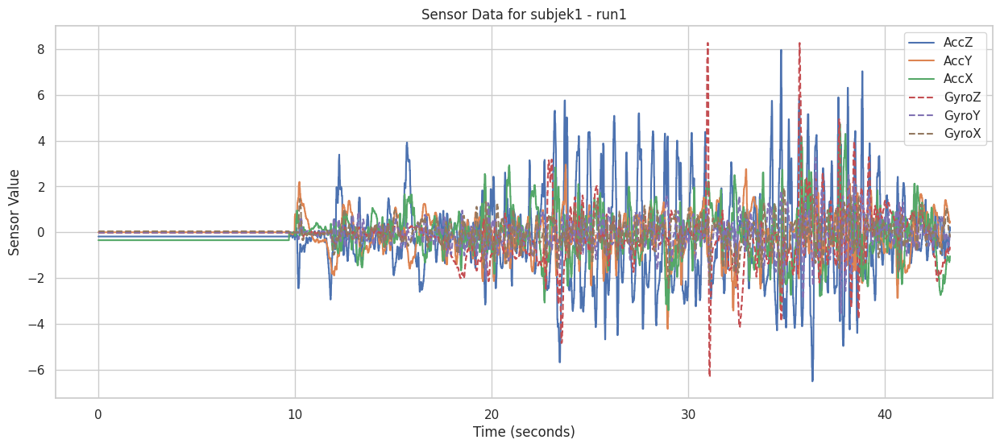

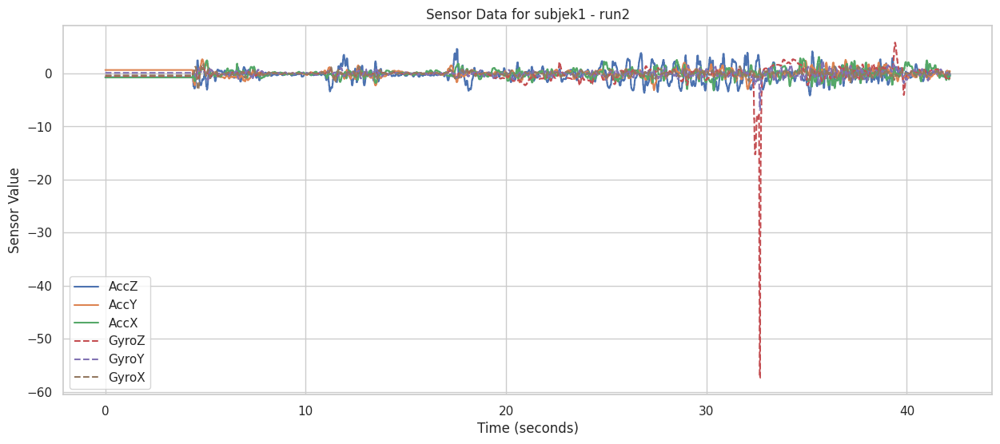

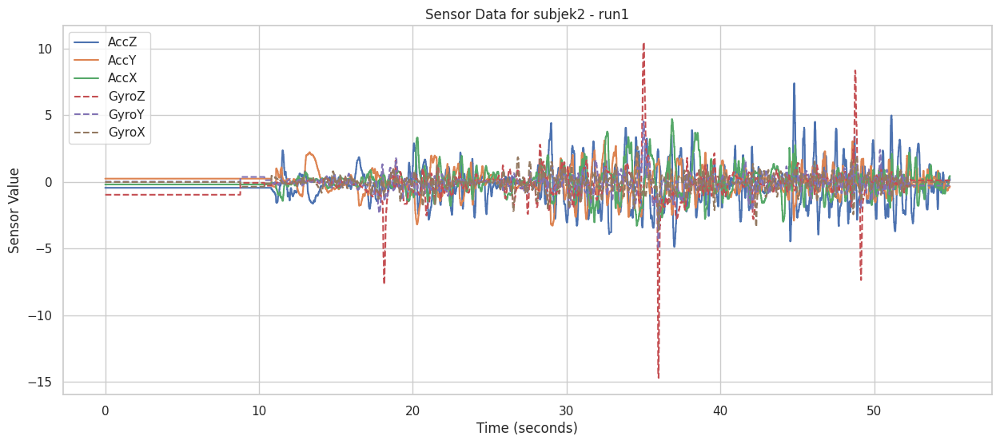

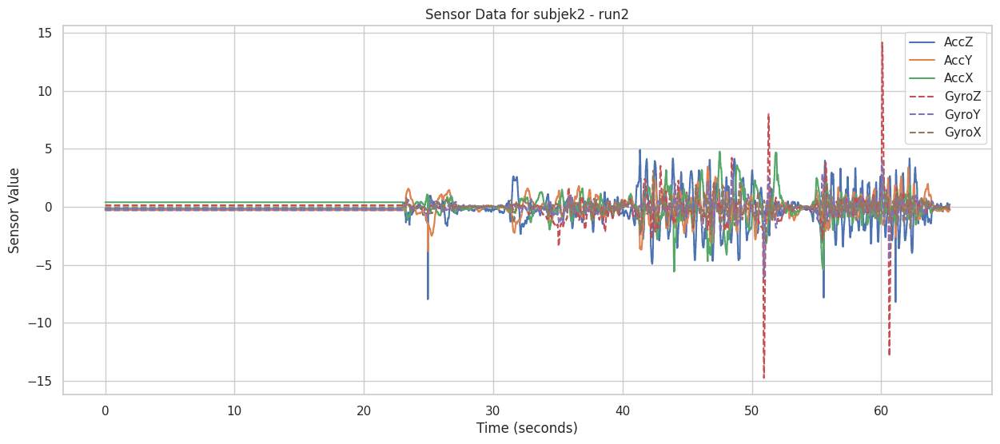

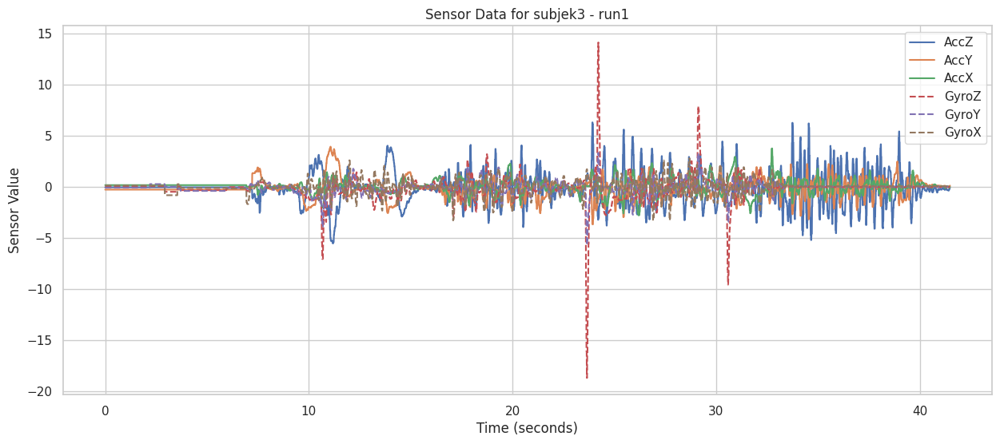

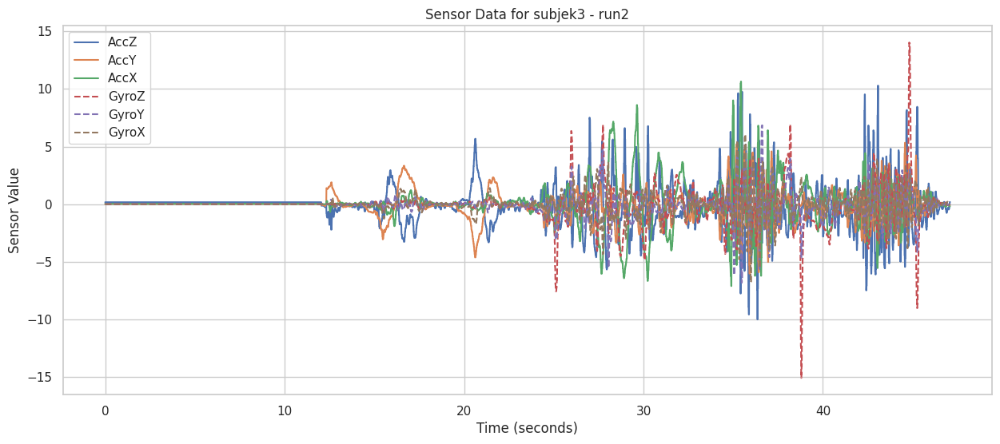

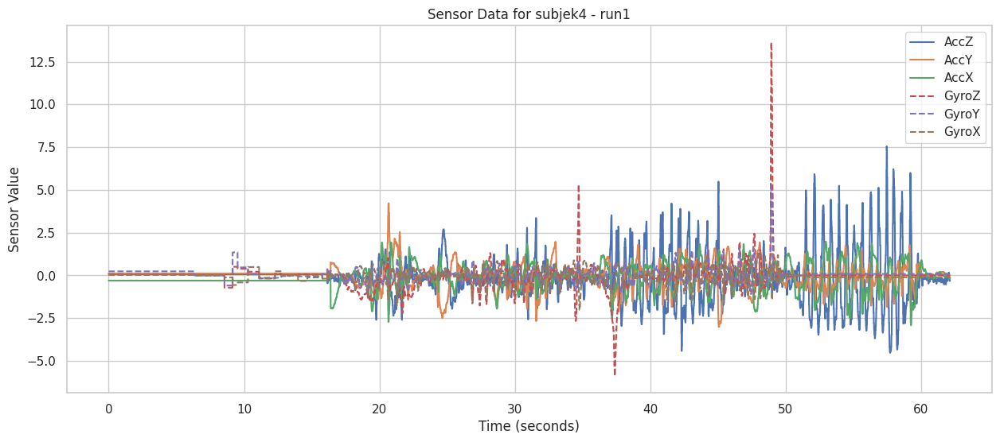

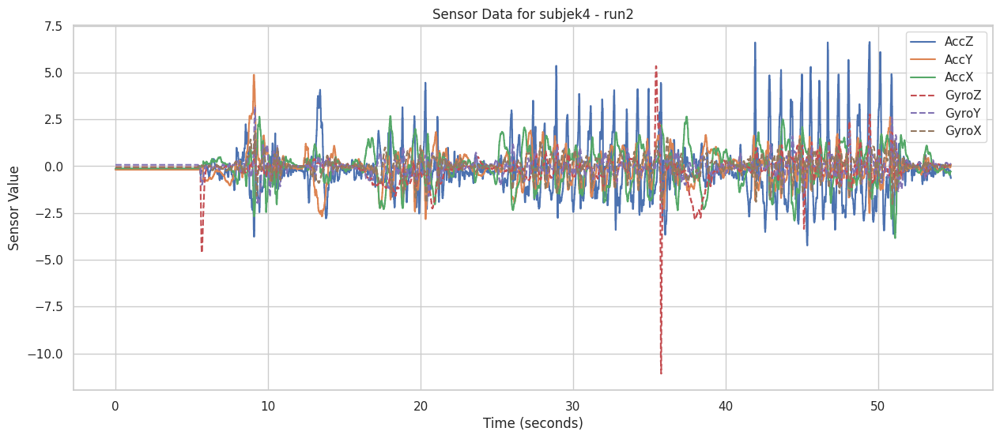

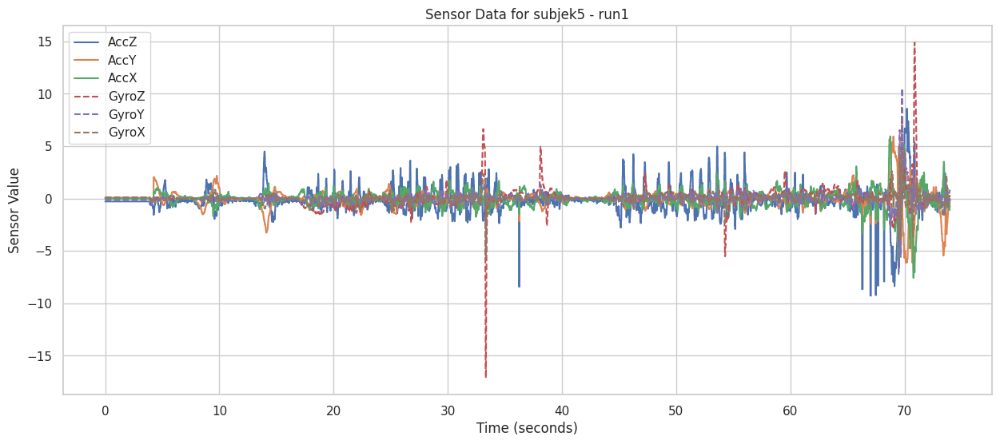

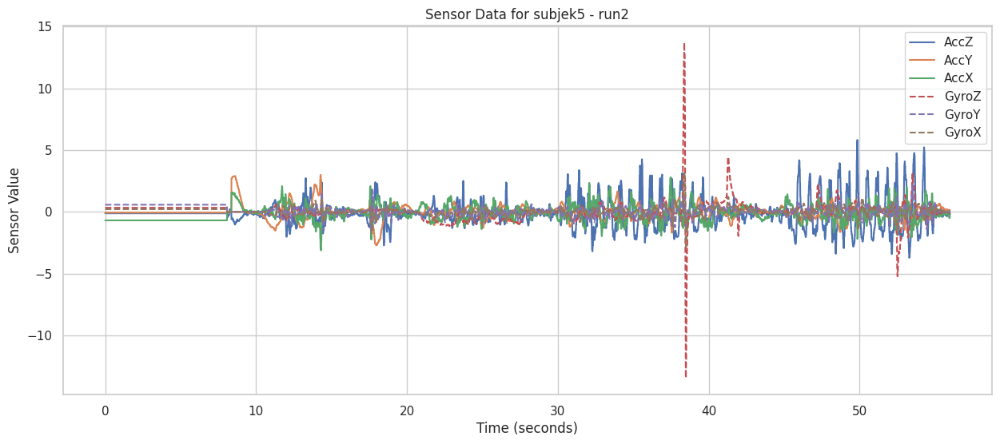

In [7]:
# Iterasi melalui setiap subjek dan run
for (subjek_val, run_val), group_df in final_resampled_dataframe.groupby(['subjek', 'run']):
    plt.figure(figsize=(15, 6)) # Buat figure baru untuk setiap plot
    plt.title(f"Sensor Data for {subjek_val} - {run_val}")

    # Plot data akselerometer
    plt.plot(group_df['elapsed'], group_df['z_x'], label='AccZ')
    plt.plot(group_df['elapsed'], group_df['y_x'], label='AccY')
    plt.plot(group_df['elapsed'], group_df['x_x'], label='AccX')

    # Plot data giroskop
    plt.plot(group_df['elapsed'], group_df['z_y'], label='GyroZ', linestyle='--')
    plt.plot(group_df['elapsed'], group_df['y_y'], label='GyroY', linestyle='--')
    plt.plot(group_df['elapsed'], group_df['x_y'], label='GyroX', linestyle='--')

    plt.xlabel("Time (seconds)")
    plt.ylabel("Sensor Value")
    plt.legend()
    plt.grid(True)
    plt.show() # Tampilkan plot untuk sesi ini

    # Di sini Anda akan secara manual mencatat rentang waktu dan labelnya
    # Misalnya, Anda mungkin melihat grafik dan memutuskan:
    # - Dari 0s - 10s: "Duduk"
    # - Dari 10s - 25s: "Berjalan"
    # - Dari 25s - 30s: "Berdiri"
    # Anda perlu menyimpan informasi ini (misalnya, dalam file CSV lain atau dictionary)


--- Generating Separate Visualizations per Sensor for Manual Labeling ---


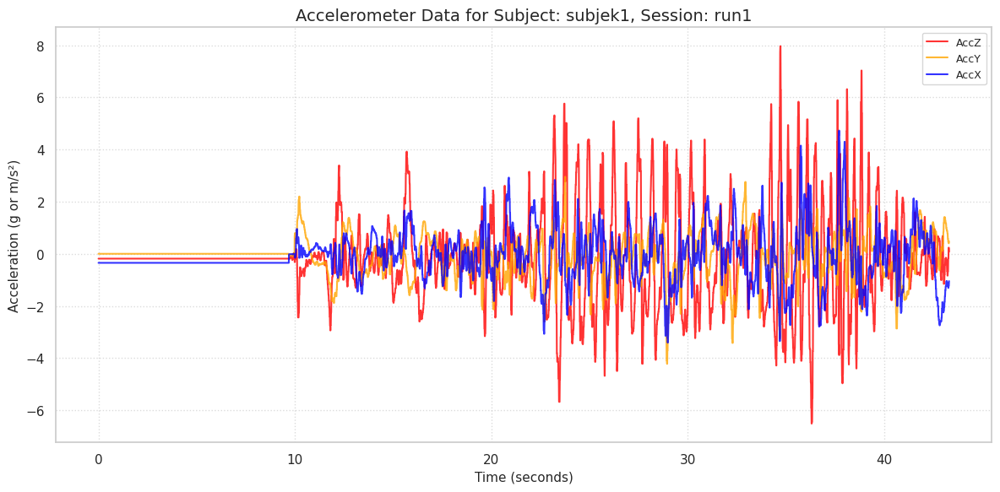

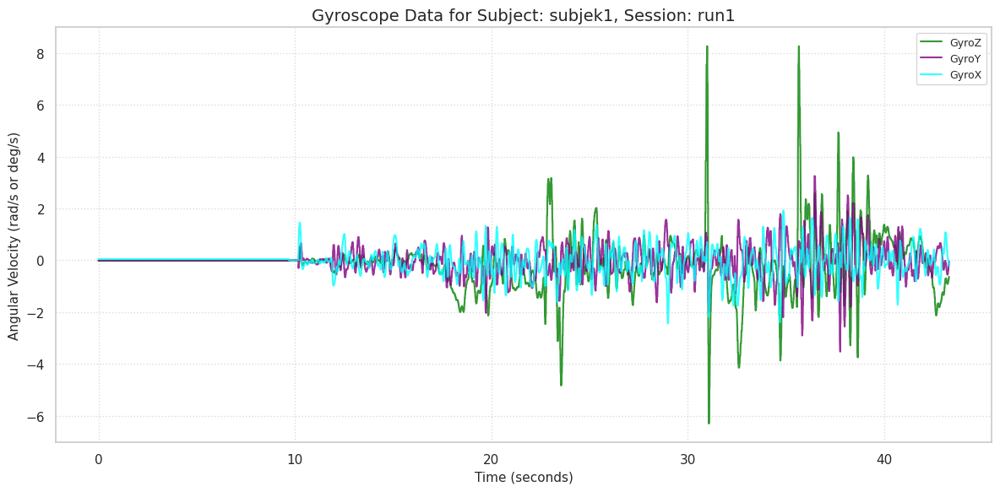

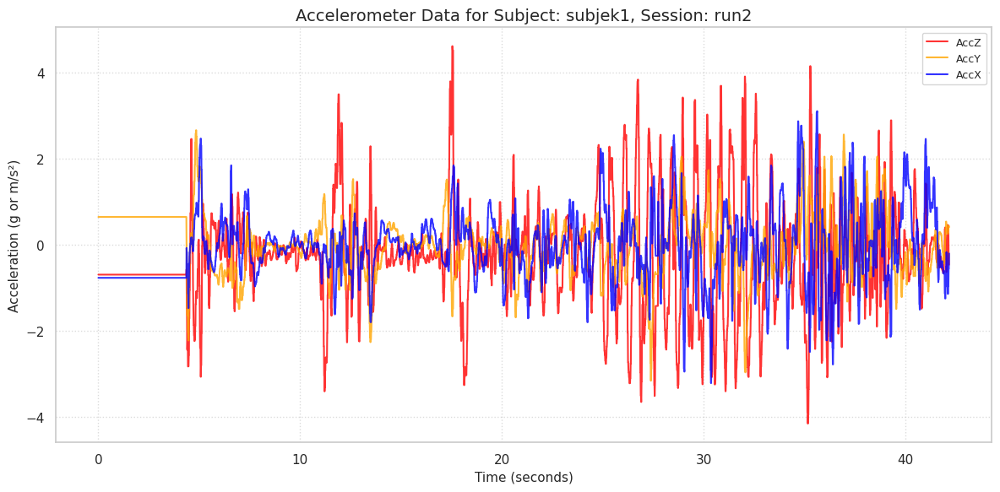

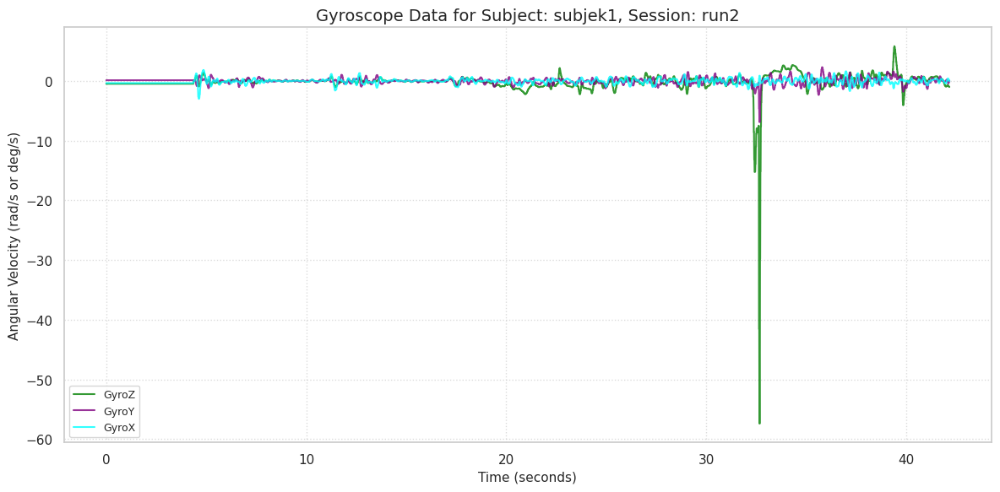

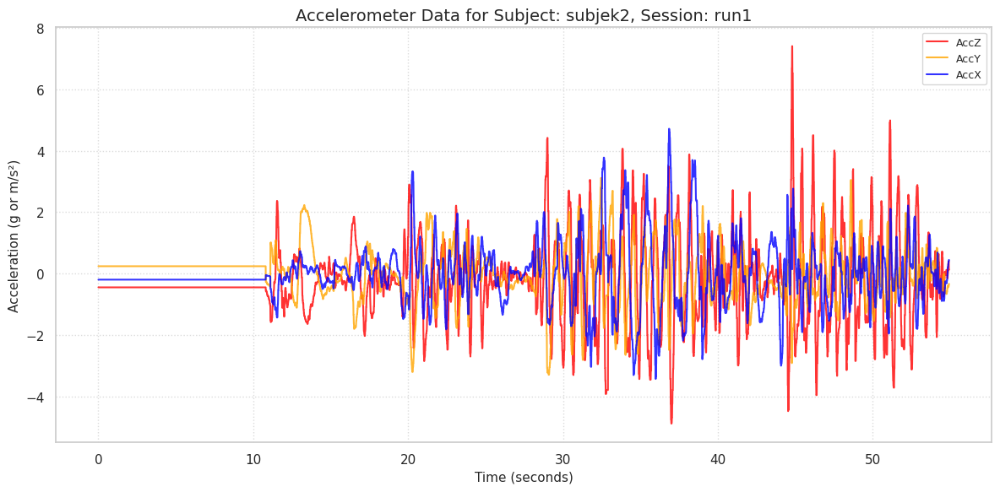

...

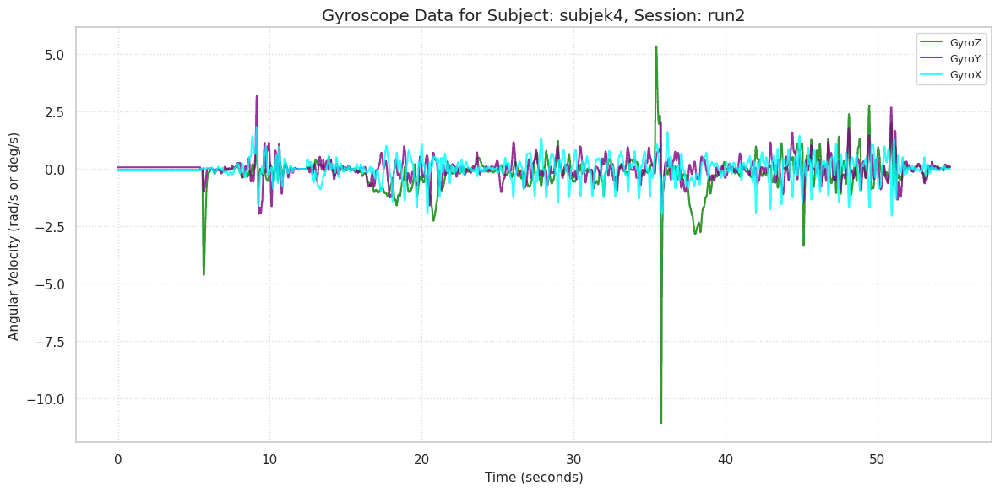

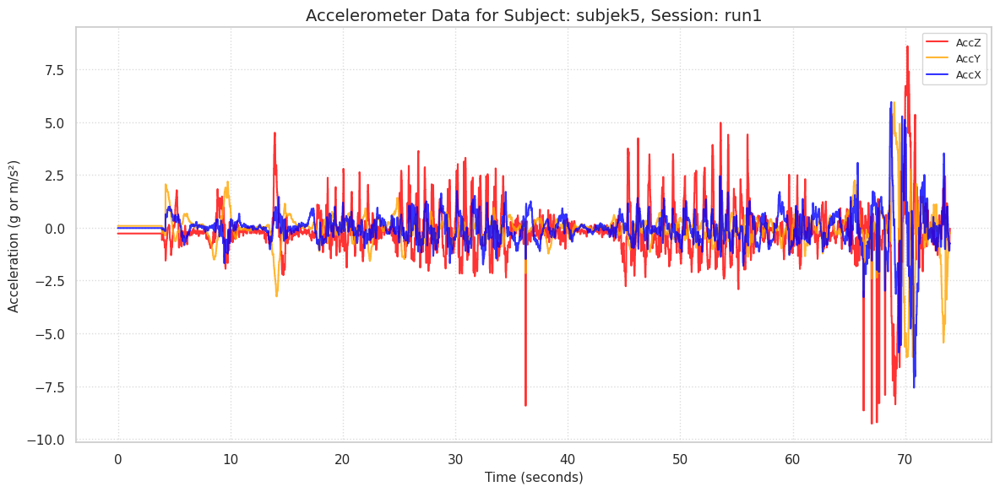

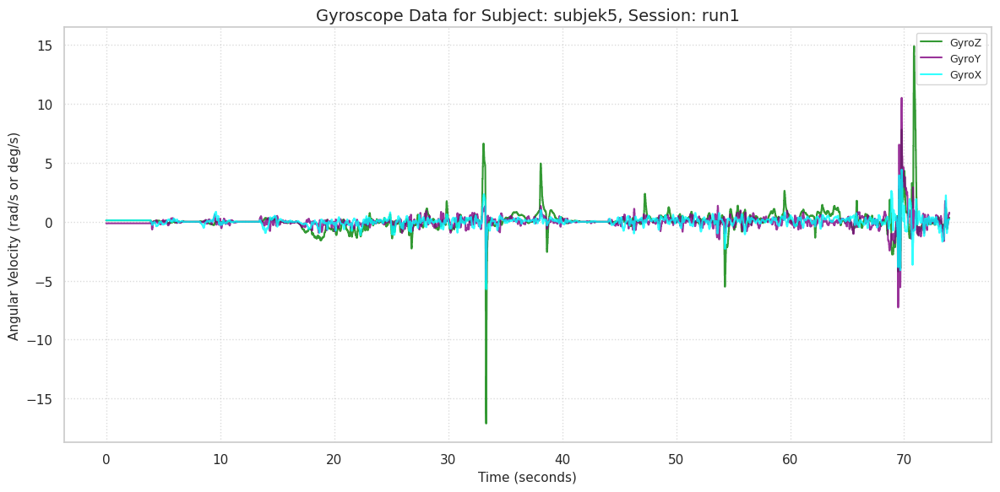

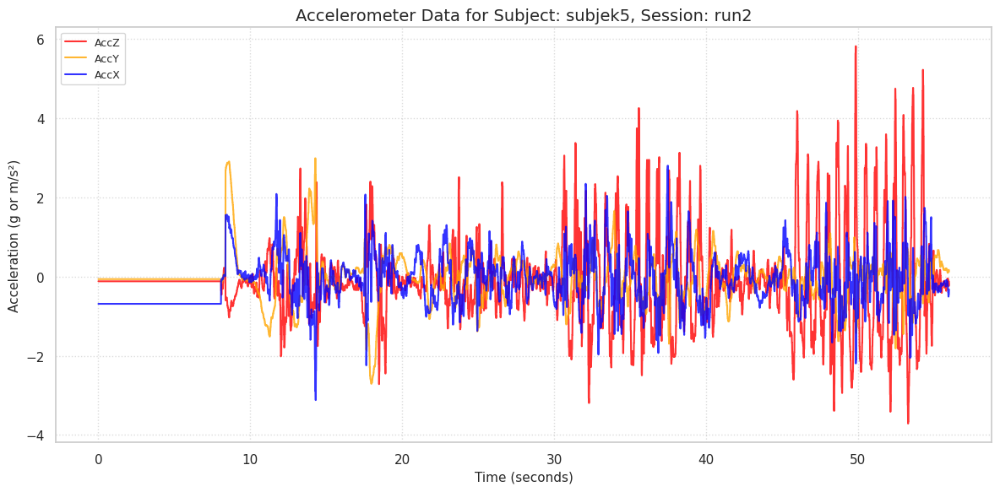

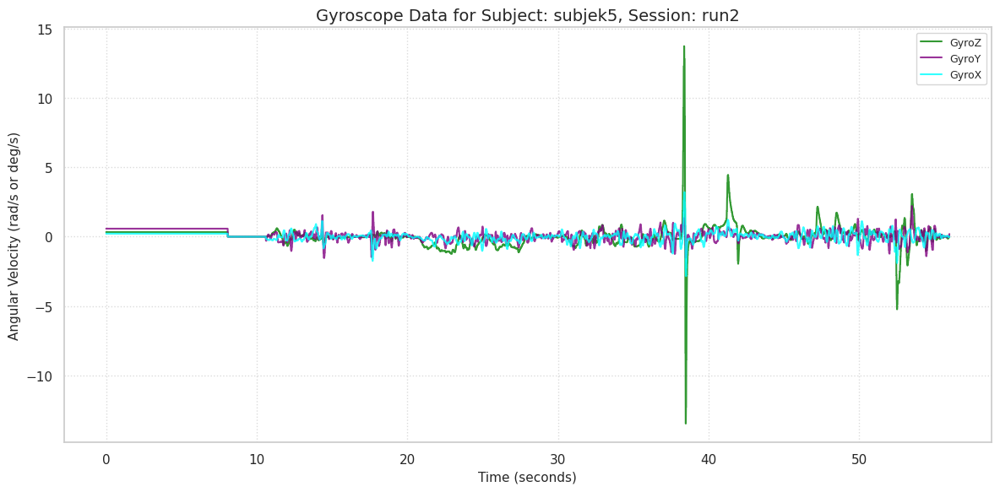


--- All separate sensor visualizations generated. ---
Please review each plot and manually record the activity labels with their start and end times.
Remember to save your labels, for example, in a CSV file.


In [8]:
# --- 4. Visualisasi Grafik Terpisah per Sensor untuk Labeling Manual ---
print("\n--- Generating Separate Visualizations per Sensor for Manual Labeling ---")

if not final_resampled_dataframe.empty:
    for (subjek_val, run_val), group_df in final_resampled_dataframe.groupby(['subjek', 'run']):
        # --- Grafik untuk Akselerometer ---
        plt.figure(figsize=(12, 6))
        plt.title(f"Accelerometer Data for Subject: {subjek_val}, Session: {run_val}", fontsize=14)
        plt.plot(group_df['elapsed'], group_df['z_x'], label='AccZ', color='red', alpha=0.8)
        plt.plot(group_df['elapsed'], group_df['y_x'], label='AccY', color='orange', alpha=0.8)
        plt.plot(group_df['elapsed'], group_df['x_x'], label='AccX', color='blue', alpha=0.8)
        plt.xlabel("Time (seconds)", fontsize=11)
        plt.ylabel("Acceleration (g or m/s²)", fontsize=11)
        plt.legend(loc='best', fontsize=9)
        plt.grid(True, linestyle=':', alpha=0.7)
        plt.tight_layout()
        plt.show()

        # --- Grafik untuk Giroskop ---
        plt.figure(figsize=(12, 6))
        plt.title(f"Gyroscope Data for Subject: {subjek_val}, Session: {run_val}", fontsize=14)
        plt.plot(group_df['elapsed'], group_df['z_y'], label='GyroZ', color='green', alpha=0.8)
        plt.plot(group_df['elapsed'], group_df['y_y'], label='GyroY', color='purple', alpha=0.8)
        plt.plot(group_df['elapsed'], group_df['x_y'], label='GyroX', color='cyan', alpha=0.8)
        plt.xlabel("Time (seconds)", fontsize=11)
        plt.ylabel("Angular Velocity (rad/s or deg/s)", fontsize=11)
        plt.legend(loc='best', fontsize=9)
        plt.grid(True, linestyle=':', alpha=0.7)
        plt.tight_layout()
        plt.show()
    
    print("\n--- All separate sensor visualizations generated. ---")
    print("Please review each plot and manually record the activity labels with their start and end times.")
    print("Remember to save your labels, for example, in a CSV file.")
else:
    print("final_resampled_dataframe is empty. No visualizations can be generated.")


In [9]:
# import pandas as pd
# Asumsi: final_resampled_dataframe sudah ada dan berisi data yang sudah di-resample
# dari langkah-langkah sebelumnya.

# --- Menampilkan Tabel Data Sensor ---

# Pilih kolom yang ingin Anda tampilkan
# Kolom sensor akselerometer biasanya diakhiri dengan '_x'
# Kolom sensor giroskop biasanya diakhiri dengan '_y'
columns_to_display = [
    'elapsed',
    'x_x', 'y_x', 'z_x',  # Akselerometer (sumbu X, Y, Z)
    'x_y', 'y_y', 'z_y',  # Giroskop (sumbu X, Y, Z)
    'subjek',
    'run'
]

# Tampilkan beberapa baris pertama dari seluruh DataFrame
print("--- Pertama 5 Baris dari Seluruh DataFrame Resampled ---")
print(final_resampled_dataframe[columns_to_display].head())

# --- Menampilkan Tabel untuk Sesi Spesifik ---
# Agar lebih mudah dianalisis, mari kita fokus pada satu subjek dan satu run.
# Ganti 'subjek1' dan 'run1' dengan nama subjek dan run yang ingin Anda periksa.
target_subjek = 'subjek1'
target_run = 'run1'

# Filter DataFrame untuk subjek dan run yang spesifik
specific_session_df = final_resampled_dataframe[
    (final_resampled_dataframe['subjek'] == target_subjek) &
    (final_resampled_dataframe['run'] == target_run)
].copy() # Menggunakan .copy() untuk menghindari SettingWithCopyWarning

if not specific_session_df.empty:
    print(f"\n--- Data Tabel untuk Subjek: {target_subjek}, Sesi: {target_run} (10 baris pertama) ---")
    # Tampilkan 10 baris pertama dari sesi spesifik
    print(specific_session_df[columns_to_display].head(10))

    print(f"\n--- Data Tabel untuk Subjek: {target_subjek}, Sesi: {target_run} (10 baris di tengah, mulai dari detik ke 10) ---")
    # Tampilkan 10 baris mulai dari waktu elapsed tertentu (misalnya, sekitar detik ke-10)
    # Ini membantu melihat transisi atau pola di tengah aktivitas
    print(specific_session_df[specific_session_df['elapsed'] >= 10.0][columns_to_display].head(10))

else:
    print(f"\nTidak ada data ditemukan untuk Subjek: {target_subjek}, Sesi: {target_run}. Periksa nama subjek/run.")

--- Pertama 5 Baris dari Seluruh DataFrame Resampled ---
   elapsed       x_x      y_x     z_x       x_y       y_y     z_y   subjek  \
0     0.00 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
1     0.01 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
2     0.02 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
3     0.03 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
4     0.04 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   

    run  
0  run1  
1  run1  
2  run1  
3  run1  
4  run1  

--- Data Tabel untuk Subjek: subjek1, Sesi: run1 (10 baris pertama) ---
   elapsed       x_x      y_x     z_x       x_y       y_y     z_y   subjek  \
0     0.00 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
1     0.01 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
2     0.02 -0.343382  0.00331 -0.1824  0.044413 -0.008525 -0.0198  subjek1   
3     0.03 -0.343382  0.00331

In [10]:
# Asumsi: final_resampled_dataframe sudah ada dari langkah-langkah sebelumnya.
# Pastikan Anda telah menjalankan bagian pemuatan dan resampling data sebelumnya.

# --- Pilih Kolom yang Ingin Anda Simpan ke CSV ---
# Ini adalah kolom-kolom yang kita diskusikan sebelumnya
columns_to_save_to_csv = [
    'subjek', 'run',        # Kolom identifikasi subjek dan sesi
    'elapsed',              # Kolom waktu
    'x_x', 'y_x', 'z_x',    # Akselerometer (sumbu X, Y, Z)
    'x_y', 'y_y', 'z_y'     # Giroskop (sumbu X, Y, Z)
]

# --- Tentukan Nama File dan Lokasi Penyimpanan CSV ---
output_csv_filename = 'all_resampled_sensor_data.csv'

# --- Simpan DataFrame ke File CSV ---
if not final_resampled_dataframe.empty:
    # Menggunakan .to_csv() untuk menyimpan DataFrame ke CSV
    # index=False agar Pandas tidak menulis indeks DataFrame sebagai kolom pertama di CSV
    final_resampled_dataframe[columns_to_save_to_csv].to_csv(output_csv_filename, index=False)
    
    print(f"Data sensor lengkap telah berhasil disimpan ke file: {output_csv_filename}")
    print(f"Anda dapat menemukan file ini di direktori yang sama dengan skrip Python Anda.")
    print("Buka file ini menggunakan Microsoft Excel, Google Sheets, atau program spreadsheet lainnya.")
else:
    print("DataFrame 'final_resampled_dataframe' kosong. Tidak ada data yang bisa disimpan ke CSV.")

Data sensor lengkap telah berhasil disimpan ke file: all_resampled_sensor_data.csv
Anda dapat menemukan file ini di direktori yang sama dengan skrip Python Anda.
Buka file ini menggunakan Microsoft Excel, Google Sheets, atau program spreadsheet lainnya.


In [11]:
# Asumsi: final_resampled_dataframe sudah ada dari langkah-langkah sebelumnya.
# Pastikan Anda telah menjalankan bagian pemuatan dan resampling data sebelumnya.

# --- Pilih Kolom yang Ingin Anda Simpan ke CSV ---
# Ini adalah kolom-kolom data sensor dan waktu yang relevan per sesi.
columns_to_save_per_session = [
    'elapsed',              # Kolom waktu
    'x_x', 'y_x', 'z_x',    # Akselerometer (sumbu X, Y, Z)
    'x_y', 'y_y', 'z_y'     # Giroskop (sumbu X, Y, Z)
    # Kolom 'subjek' dan 'run' tidak perlu disertakan di sini karena akan menjadi bagian dari nama file
]

# --- Tentukan Direktori Output untuk File CSV Terpisah ---
# Buat folder baru jika belum ada untuk menyimpan CSV per sesi
output_directory = 'resampled_data_per_session'
os.makedirs(output_directory, exist_ok=True) # exist_ok=True agar tidak error jika folder sudah ada

print(f"--- Menyimpan Data Per Subjek dan Per Sesi ke CSV Terpisah di folder: {output_directory} ---")

if not final_resampled_dataframe.empty:
    # Iterasi melalui setiap kelompok subjek dan sesi
    for (subjek_val, run_val), group_df in final_resampled_dataframe.groupby(['subjek', 'run']):
        # Buat nama file unik untuk setiap sesi
        output_filename = f"{subjek_val}_{run_val}_data.csv"
        output_filepath = os.path.join(output_directory, output_filename)
        
        # Simpan DataFrame grup ini ke file CSV terpisah
        # Pastikan hanya kolom yang relevan yang disimpan
        group_df[columns_to_save_per_session].to_csv(output_filepath, index=False)
        
        print(f"Saved: {output_filepath}")
    
    print("\n--- Semua file CSV per subjek dan per sesi telah berhasil dibuat. ---")
    print(f"Anda dapat menemukan file-file tersebut di folder '{output_directory}'.")
else:
    print("DataFrame 'final_resampled_dataframe' kosong. Tidak ada data yang bisa disimpan.")

--- Menyimpan Data Per Subjek dan Per Sesi ke CSV Terpisah di folder: resampled_data_per_session ---
Saved: resampled_data_per_session/subjek1_run1_data.csv
Saved: resampled_data_per_session/subjek1_run2_data.csv
Saved: resampled_data_per_session/subjek2_run1_data.csv
Saved: resampled_data_per_session/subjek2_run2_data.csv
Saved: resampled_data_per_session/subjek3_run1_data.csv
Saved: resampled_data_per_session/subjek3_run2_data.csv
Saved: resampled_data_per_session/subjek4_run1_data.csv
Saved: resampled_data_per_session/subjek4_run2_data.csv
Saved: resampled_data_per_session/subjek5_run1_data.csv
Saved: resampled_data_per_session/subjek5_run2_data.csv

--- Semua file CSV per subjek dan per sesi telah berhasil dibuat. ---
Anda dapat menemukan file-file tersebut di folder 'resampled_data_per_session'.


In [12]:
import plotly.express as px # Import Plotly Express

# Asumsi: final_resampled_dataframe sudah ada dari langkah-langkah sebelumnya.

# --- Bagian Pemuatan dan Resampling (Sama seperti sebelumnya) ---
# Anda akan menjalankan seluruh kode dari atas sampai sini terlebih dahulu
# untuk memastikan final_resampled_dataframe Anda sudah siap.
# (Saya tidak akan menyertakan kode load_sensor, load_all_data, dan resampling di sini
#  untuk menjaga jawaban tetap ringkas, asumsikan sudah dijalankan sebelumnya)


# --- Visualisasi Interaktif dengan Plotly Express untuk Labeling Manual ---
print("\n--- Generating Interactive Visualizations per Sensor for Manual Labeling ---")
print("Anda akan melihat plot interaktif di browser web atau output lingkungan Anda.")
print("Gunakan fungsi zoom dan pan untuk menganalisis data dan hover untuk melihat nilai tepatnya.")

if not final_resampled_dataframe.empty:
    for (subjek_val, run_val), group_df in final_resampled_dataframe.groupby(['subjek', 'run']):
        print(f"Displaying interactive plot for Subject: {subjek_val}, Session: {run_val}")

        # --- Plot untuk Akselerometer ---
        fig_accel = px.line(
            group_df, 
            x='elapsed', 
            y=['x_x', 'y_x', 'z_x'], # Kolom akselerometer
            title=f"Accelerometer Data - Subject: {subjek_val}, Session: {run_val}",
            labels={'value': 'Acceleration (g or m/s²)', 'elapsed': 'Time (seconds)'},
            line_dash_map={'x_x': 'solid', 'y_x': 'solid', 'z_x': 'solid'} # Garis solid
        )
        fig_accel.update_layout(hovermode="x unified", legend_title_text="Axis") # Hover informasi lebih mudah
        fig_accel.show() # Akan membuka di browser atau menampilkan di lingkungan Jupyter

        # --- Plot untuk Giroskop ---
        fig_gyro = px.line(
            group_df, 
            x='elapsed', 
            y=['x_y', 'y_y', 'z_y'], # Kolom giroskop
            title=f"Gyroscope Data - Subject: {subjek_val}, Session: {run_val}",
            labels={'value': 'Angular Velocity (rad/s or deg/s)', 'elapsed': 'Time (seconds)'},
            line_dash_map={'x_y': 'dot', 'y_y': 'dot', 'z_y': 'dot'} # Garis putus-putus
        )
        fig_gyro.update_layout(hovermode="x unified", legend_title_text="Axis")
        fig_gyro.show()

    print("\n--- All interactive visualizations generated. ---")
    print("Gunakan fitur zoom dan pan pada plot untuk membantu labeling manual Anda.")
    print("Catat rentang waktu dan label aktivitas di file CSV seperti yang sudah dibahas.")
else:
    print("final_resampled_dataframe is empty. No visualizations can be generated.")


--- Generating Interactive Visualizations per Sensor for Manual Labeling ---
Anda akan melihat plot interaktif di browser web atau output lingkungan Anda.
Gunakan fungsi zoom dan pan untuk menganalisis data dan hover untuk melihat nilai tepatnya.
Displaying interactive plot for Subject: subjek1, Session: run1


Displaying interactive plot for Subject: subjek1, Session: run2


Displaying interactive plot for Subject: subjek2, Session: run1


Displaying interactive plot for Subject: subjek2, Session: run2


Displaying interactive plot for Subject: subjek3, Session: run1


Displaying interactive plot for Subject: subjek3, Session: run2


Displaying interactive plot for Subject: subjek4, Session: run1


Displaying interactive plot for Subject: subjek4, Session: run2


Displaying interactive plot for Subject: subjek5, Session: run1


Displaying interactive plot for Subject: subjek5, Session: run2



--- All interactive visualizations generated. ---
Gunakan fitur zoom dan pan pada plot untuk membantu labeling manual Anda.
Catat rentang waktu dan label aktivitas di file CSV seperti yang sudah dibahas.


In [13]:
# 1. Baca file
anotasi = pd.read_csv('/kaggle/input/annotated-activity/Anotasi - Sheet1.csv')
sensor = pd.read_csv('/kaggle/working/all_resampled_sensor_data.csv')

# 2. Konversi start_time dan end_time ke float detik (pastikan formatnya, misal: 0.0, 12.4 dst)
# Kalau perlu, cek dan parse format, tapi biasanya sudah float/int
anotasi['Start_time'] = anotasi['Start_time'].astype(float)
anotasi['End_time'] = anotasi['End_time'].astype(float)
sensor['elapsed'] = sensor['elapsed'].astype(float)

# 3. Fungsi mapping
def get_label(elapsed):
    row = anotasi[(anotasi['Start_time'] <= elapsed) & (elapsed < anotasi['End_time'])]
    return row['Label'].values[0] if len(row) > 0 else 'unknown'

sensor['Label'] = sensor['elapsed'].apply(get_label)

# 5. Simpan hasil
sensor.to_csv('/kaggle/working/all_sensor_with_label.csv', index=False)
print(sensor[['elapsed','Label']].head(10))

   elapsed    Label
0     0.00  Berdiri
1     0.01  Berdiri
2     0.02  Berdiri
3     0.03  Berdiri
4     0.04  Berdiri
5     0.05  Berdiri
6     0.06  Berdiri
7     0.07  Berdiri
8     0.08  Berdiri
9     0.09  Berdiri


In [14]:
pd.read_csv('/kaggle/working/all_resampled_sensor_data.csv')

,subjek,run,elapsed,x_x,y_x,z_x,x_y,y_y,z_y
0,subjek1,run1,0.00,-0.343382,0.003310,-0.182400,0.044413,-0.008525,-0.019800
1,subjek1,run1,0.01,-0.343382,0.003310,-0.182400,0.044413,-0.008525,-0.019800
2,subjek1,run1,0.02,-0.343382,0.003310,-0.182400,0.044413,-0.008525,-0.019800
3,subjek1,run1,0.03,-0.343382,0.003310,-0.182400,0.044413,-0.008525,-0.019800
4,subjek1,run1,0.04,-0.343382,0.003310,-0.182400,0.044413,-0.008525,-0.019800
...,...,...,...,...,...,...,...,...,...
54120,subjek5,run2,55.95,-0.504755,0.159211,-0.161806,-0.033413,0.051287,-0.048125
54121,subjek5,run2,55.96,-0.504755,0.159211,-0.161806,-0.033413,0.051287,-0.048125
54122,subjek5,run2,55.97,-0.442852,0.171467,-0.237252,-0.021038,0.124163,-0.000550
54123,subjek5,run2,55.98,-0.442852,0.171467,-0.237252,-0.021038,0.124163,-0.000550


In [15]:
import pandas as pd

# Baca kedua file
sensor = pd.read_csv('/kaggle/working/all_resampled_sensor_data.csv')
with_label = pd.read_csv('/kaggle/working/all_sensor_with_label.csv')  # misal: elapse,label
# Cek panjang sama (harusnya sama jika file kedua hasil pelabelan file pertama)
print(len(sensor), len(with_label))

# Tambahkan kolom Label (atau Activity) ke file sensor
# Gunakan nama kolom yang ada di file label: misal 'Activity' atau 'Label'
if 'Label' in with_label.columns:
    sensor['Label'] = with_label['Label']
elif 'Activity' in with_label.columns:
    sensor['Activity'] = with_label['Activity']
else:
    raise ValueError("Kolom label tidak ditemukan di file pelabelan.")

# Merge berdasarkan 'elapse'
# data_merged = pd.merge(sensor, label, on='elapsed', how='left')

# # Cek hasil
#print(data_merged.head())

# Simpan hasil
sensor.to_csv('/kaggle/working/all_resampled_sensor_data_with_label.csv', index=False)


54125 54125


In [48]:
import numpy as np
import pandas as pd

# data: DataFrame, kolom sensor + label ('Activity'), sudah aligned
# Windowing

df = pd.read_csv('/kaggle/working/all_resampled_sensor_data_with_label.csv')
def create_windows(df, window_size, step, feature_cols, label_col):
    X, y = [], []
    for start in range(0, len(df) - window_size + 1, step):
        end = start + window_size
        X.append(df[feature_cols].iloc[start:end].values)
        y.append(df[label_col].iloc[start])  # bisa pakai mode, atau first
    return np.array(X), np.array(y)

feature_cols = ['x_x', 'y_x', 'z_x', 'x_y', 'y_y', 'z_y']  # contoh
label_col = 'Label'
window_size = 100  # 2 detik jika 50 Hz
step = 10  # overlap 10%

X, y = create_windows(df, window_size, step, feature_cols, label_col)

In [58]:
from scipy.stats import mode

def extract_features_from_window(window, feature_cols):
    feats = {}
    for col in feature_cols:
        vals = window[col].values
        feats[f'{col}_mean'] = np.mean(vals)
        feats[f'{col}_std'] = np.std(vals)
        feats[f'{col}_min'] = np.min(vals)
        feats[f'{col}_max'] = np.max(vals)
        feats[f'{col}_rms'] = np.sqrt(np.mean(vals**2))
    # Magnitude (misal, fitur utama akselerometer/gyro 3D)
    if set(['x_x','y_x','z_x']).issubset(feature_cols):
        v = window[['x_x','y_x','z_x']].values
        mag = np.sqrt((v**2).sum(axis=1))
        feats['acc_mag_mean'] = np.mean(mag)
        feats['acc_mag_std'] = np.std(mag)
    if set(['x_y','y_y','z_y']).issubset(feature_cols):
        v = window[['x_y','y_y','z_y']].values
        mag = np.sqrt((v**2).sum(axis=1))
        feats['gyro_mag_mean'] = np.mean(mag)
        feats['gyro_mag_std'] = np.std(mag)
    return feats

def extract_features(df, window_size, step, feature_cols, label_col):
    features = []
    labels = []
    for start in range(0, len(df) - window_size + 1, step):
        end = start + window_size
        window = df.iloc[start:end]
        feats = extract_features_from_window(window, feature_cols)
        # Label = mode di window, atau pakai .iloc[0] kalau label window stabil
        labels.append(window[label_col].iloc[0])
        features.append(feats)
    return pd.DataFrame(features), np.array(labels)

# Misal fitur kolom sama seperti windowing LSTM
feature_cols = ['x_x', 'y_x', 'z_x', 'x_y', 'y_y', 'z_y']
label_col = 'Label'
window_size = 100
step = 10

X, y = create_windows(df, window_size, step, feature_cols, label_col)

# Label encoding jika y masih string
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

In [59]:
import collections
print(collections.Counter(y_encoded))


Counter({4: 2266, 0: 1268, 2: 892, 3: 800, 1: 174, 5: 3})


In [60]:
# Hitung jumlah sample per kelas
unique, counts = np.unique(y_encoded, return_counts=True)
label_count = dict(zip(unique, counts))
few_labels = [lbl for lbl, cnt in label_count.items() if cnt < 10]

print("Kelas yang kurang dari 10 sample:", few_labels)

# Filter data (buang kelas terlalu sedikit)
mask = ~np.isin(y_encoded, few_labels)
X_filtered = X[mask]
y_filtered = y_encoded[mask]

print("Shape X_filtered:", X_filtered.shape)


Kelas yang kurang dari 10 sample: [5]
Shape X_filtered: (5400, 100, 6)


In [61]:
from sklearn.model_selection import train_test_split

X_train, X_temp, y_train, y_temp = train_test_split(
    X_filtered, y_filtered, test_size=0.3, random_state=42, stratify=y_filtered)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)
print(X_train.shape, X_val.shape, X_test.shape)


(3780, 100, 6) (810, 100, 6) (810, 100, 6)


In [21]:
!pip install tensorflow

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.2768 - loss: 1.5599 - val_accuracy: 0.4198 - val_loss: 1.3908
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4109 - loss: 1.3954 - val_accuracy: 0.4235 - val_loss: 1.2915
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4805 - loss: 1.2990 - val_accuracy: 0.5469 - val_loss: 1.2036
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5544 - loss: 1.2290 - val_accuracy: 0.5432 - val_loss: 1.2089
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5518 - loss: 1.2209 - val_accuracy: 0.5728 - val_loss: 1.1501
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5659 - loss: 1.1789 - val_accuracy: 0.5741 - val_loss: 1.1258
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5689 - loss: 1.1480 - val_accuracy: 0.5790 - val_loss: 1.1140
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5671 - loss: 1.1342 - val_accuracy: 0.5852 - val_loss: 1.0998
Ep

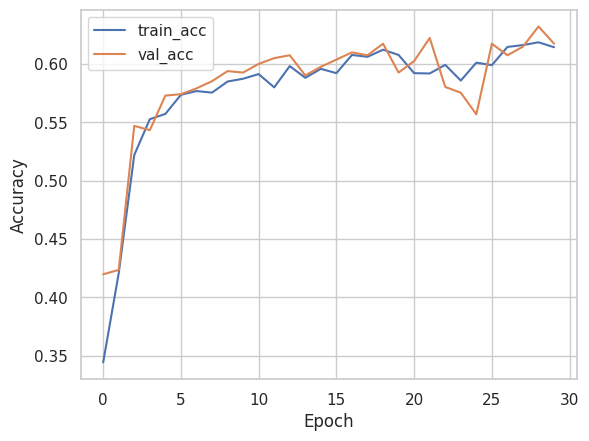

In [62]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.utils import to_categorical

# Asumsi kamu sudah punya X_train, X_val, X_test, y_train, y_val, y_test
# X_train.shape = (n_sample, window_size, n_features)
# y_train sudah label encoded (0,1,2,3,...), kelas yang sangat kecil sudah difilter

# 1. Convert label ke categorical (one-hot) untuk multiclass
num_classes = len(np.unique(y_train))
y_train_cat = to_categorical(y_train, num_classes)
y_val_cat = to_categorical(y_val, num_classes)
y_test_cat = to_categorical(y_test, num_classes)

# 2. Build LSTM Model
model = Sequential()
model.add(LSTM(32, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 3. Train Model
history = model.fit(
    X_train, y_train_cat,
    epochs=30,
    batch_size=64,
    validation_data=(X_val, y_val_cat),
    verbose=1
)

# 4. Evaluasi
loss, acc = model.evaluate(X_test, y_test_cat)
print(f"Test accuracy: {acc:.4f}")

# 5. (Opsional) Plot learning curve
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


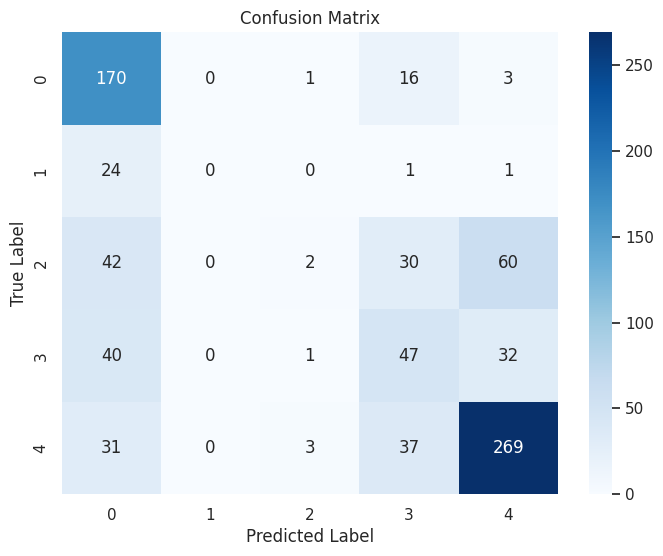

=== Classification Report ===
              precision    recall  f1-score   support

           0       0.55      0.89      0.68       190
           1       0.00      0.00      0.00        26
           2       0.29      0.01      0.03       134
           3       0.36      0.39      0.37       120
           4       0.74      0.79      0.76       340

    accuracy                           0.60       810
   macro avg       0.39      0.42      0.37       810
weighted avg       0.54      0.60      0.54       810

Overall Accuracy: 0.6025


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [63]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Ambil prediksi model
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

# Jika label asli one-hot, ubah ke integer
if len(y_test_cat.shape) > 1 and y_test_cat.shape[1] > 1:
    y_true = np.argmax(y_test_cat, axis=1)
else:
    y_true = y_test

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Classification Report (akurasi, precision, recall, F1 per kelas)
print("=== Classification Report ===")
print(classification_report(y_true, y_pred))

# Akurasi keseluruhan
acc = accuracy_score(y_true, y_pred)
print(f"Overall Accuracy: {acc:.4f}")